### Анализ исследования рынка Москвы для фонда "Shut Up and Take My Money"

**Цель:**

Подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

**Задачи:**
 - Изучить датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года;
 - Исследовать количество объектов общественного питания по категориям;
 - Исследовать количество посадочных мест в местах по категориям;
 - Рассмотреть и изобразить соотношение сетевых и несетевых заведений в датасете. Узнать какие категории заведений чаще являются сетевыми;
 - Найти топ-15 популярных сетей в Москве;
 - Построить фоновую картограмму (хороплет) со средним рейтингом заведений каждого района;
 - Отобразить все заведения датасета на карте с помощью кластеров; 
 - Найти топ-15 улиц по количеству заведений;
 - Проанализировать цены в центральном административном округе и других. Уточнить как удалённость от центра влияет на цены в заведениях;
 - Дать рекомендации заказчику касательно открытия кафе в стиле "Central Perk";
 - Подготовить презентацию.
 
**Шаги анализа:**
 
 Все данные для анализа мы возьмем из датасета, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года (открытые источники):
  1. Датасет с заведениями общественного питания Москвы `/datasets/moscow_places.csv`
  
Для начала, нам необходимо ознакомиться с датафреймом: выявить явные и неявные дубликаты, узнать количество пропусков, строк в датасете, изучить типы данных.

Далее мы выполним предобработку данных, а также добавим столбцы в датасет: 1. Столбец с названием улиц; 2. Столбец с обозначением режима работы заведения (круглосуточно/ежедневно или наоборот).

После предобработки мы приступим к исследовательскому анализу данных: решим поставленные задачи и визуализируем данные. На данном этапе сделаем промежуточные выводы.

Так как заказчик хочет открыть кафе в стиле "Central Perk", мы выполним дополнительную детализацию исследования и дадим ему рекомендации, касательно открытия заведения.

Сделаем общий вывод и подготовим презентацию.


Данный анализ будет выполнен в **5 этапов:**
  1. Изучение общей информации
  2. Предобработка данных
  3. Исследовательский анализ данных
  4. Детализация исследования
  5. Презентация

### Шаг №1: Изучение общей информации

In [1]:
pip install missingno

Note: you may need to restart the kernel to use updated packages.


In [2]:
#импортируем все необходимые библеотеки для анализа

import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
from plotly import graph_objects as go
%matplotlib inline
import datetime as dt
import string
import missingno as msno
import json

from folium import Map, Choropleth
from folium import Marker
from folium.plugins import MarkerCluster

In [3]:
#загрузим датафрейм и сохраним его в переменную

df = pd.read_csv('/datasets/moscow_places.csv')

In [4]:
#создадим функцию для ознакомления с датафреймом

def pre_processing(data):
    
    #выведем первые пять строк фрейма
    head_info = display(data.head())
    print('-'*50)
    
    #выведем общую информацию о фрейме
    inform = data.info()
    print('-'*50)
    
    #проверим наличие явных дубликатов
    dub_count = data.duplicated().sum()
    print('Количество дубликатов равно', dub_count)

In [5]:
#изучим визуально фрейм вызвав функцию pre_processing

pre_processing(df)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


--------------------------------------------------
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB
----------

<AxesSubplot:>

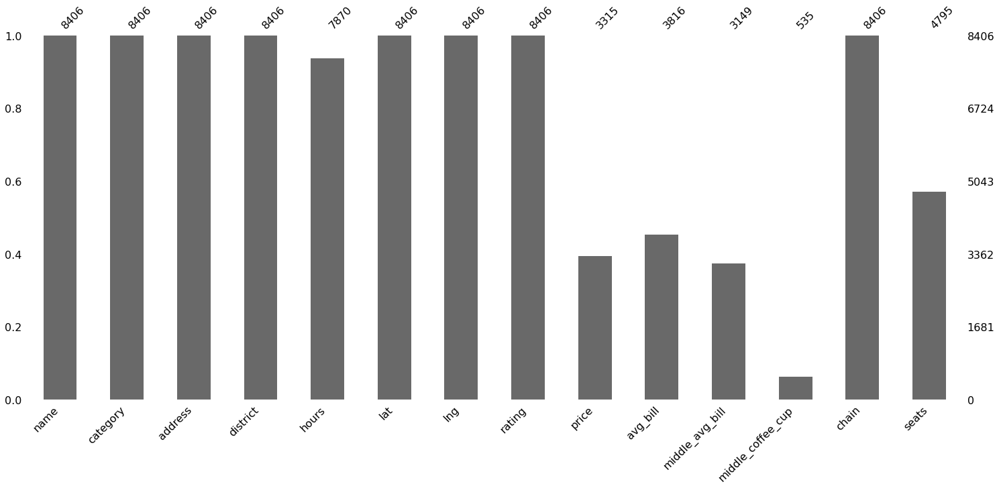

In [6]:
#визуализируем пропуски

msno.bar(df)

_**Промежуточный вывод:** Из полученной информации мы видим, что в датафрейме представлена информация для **8406** заведений. Явных дубликатов нет, но есть пропуски в столбцах: `hours, price, avg_bill, middle_avg_bill, middle_coffee_cup, chain, seats`. Причиной данных пропусков, скорее всего служит - неполное заполнение информации о заведении собственником на геолокационных ресурсах. На следующем шаге анализа мы более подробнее ознакомимся со всеми столбцами и проверим возможность заполнения пропусков. Типы данных столбцов корректны, кроме `13 seats`, количество посадочных мест должно быть целое число, но так как в данном столбце мы не можем заполнить пропуски, потому что есть значения NaN, которые считываются как `float`, по этому оставляем столбец как есть._

### Шаг №2: Предобработка данных

Ознакомимся более подробно со столбцами, посмотрим какие данные они хранят и есть ли неявные дубликаты.

#### Столбец 'name'

In [7]:
#посмотрим на названия заведений

sorted(df['name'].unique())

['#КешбэкКафе',
 '+39 Pizzeria Mozzarella bar',
 '1 Этаж',
 '1-я Креветочная',
 '10 Идеальных Пицц',
 '1001 Ночь',
 '100ловая',
 '100лоффка',
 '13',
 '13 Chef doner',
 '15 Kitchen+Bar',
 '15-й Шар',
 '16 Июня',
 '16 Тонн',
 '18 Грамм',
 '1901 Comfort Food Zone',
 '1у',
 '2 Типа',
 '2-й Этаж',
 '2046',
 '21 Век',
 '22 Акра Кофе&Хлеб',
 '2U-Ту-Ю',
 '3 Ступени',
 '351 Bar',
 '4 Сезона',
 '4.2. Bar',
 '4/1 Restaurant',
 '42 Coffee Shop',
 '47',
 '495',
 '4friends Coffee',
 '4tuna Cafe&Grill',
 '5 Stars Coffee',
 '55.709201, 37.392257',
 '6 Am Bread Kitchen',
 '6 Рукопожатий',
 '69 раков',
 '7 Сэндвичей',
 '7 элемент',
 '7/12',
 '8 Oz',
 '8 Вафель',
 '8 Зёрен',
 '8 Пончиков',
 '800°с Contemporary Steak',
 '8bit Pizza',
 '9 Bar Coffe',
 '9 Bar Coffee',
 '9 Зёрен',
 'A-cafe',
 'ABC Coffee Roasters',
 'ABC coffee roasters',
 'Acai Family',
 'Accent',
 "Adam's Chicken",
 'Adria Mare',
 'Ahava',
 'Air Coffee',
 'Al Halal',
 'Al33 Пиццерия бар Боттега',
 'All Day',
 'Alma',
 'Alternative coffee',

При первом визуальном осмотре, мы уже видим задвоение в названиях:'ABC Coffee Roasters','ABC coffee roasters'. По этому приведём наименование всех заведений к нижнему регистру, а также заменим различные символы на пробел.

In [8]:
print(f"Число уникальных наименований до обработки: {len(df['name'].unique())}")

Число уникальных наименований до обработки: 5614


In [9]:
#приводим наименования к нижнему регистру

df['name'] = df['name'].str.lower()

In [10]:
#избавимся от всех ненужных символов в наименованиях

df['name'] = df['name'].replace(r'[{}]'.format(string.punctuation), ' ', regex=True)

In [11]:
print(f"Число уникальных наименований после обработки: {len(df['name'].unique())}")

Число уникальных наименований после обработки: 5492


122 наименований заведений было задвоено. Теперь проверим как расспределилось количество уникальных заведений.

In [12]:
#проверим какое количество уникальных названий в себе содержит столбец name

df['name'].value_counts()

кафе                    189
шоколадница             120
домино с пицца           77
додо пицца               74
яндекс лавка             72
                       ... 
farang                    1
coffezdes                 1
sodexo                    1
кампанелло                1
таверна дядя геральт      1
Name: name, Length: 5492, dtype: int64

189 кафе с названием "Кафе". Посмотрим во фрейме присвоен ли им статус сети, если да - тогда нужно изменить статус, так как такой сети не существует.


In [13]:
cafe = df[df['name'] == "кафе"]
cafe['chain'].unique()

array([0])

Данные заведения не относятся к сети, видимо просто много придорожных кафе с "оригинальным" названием.

#### Столбец 'category'

In [14]:
#проверим уникальные значения столбца category

sorted(df['category'].unique())

['бар,паб',
 'булочная',
 'быстрое питание',
 'кафе',
 'кофейня',
 'пиццерия',
 'ресторан',
 'столовая']

Заведения поделены на 8 уникальных категорий.

#### Столбец 'address'

Уникальные названия в столбцах `adress, lat, lng` проверять не будем, данных очень много и они могут повторяться, так как в одном доме могут находиться несколько заведений. По этому, добавим столбец, где будут выделены улицы, чтобы легче было группировать данные для дальнейшего анализа.

In [15]:
#напишем функцию для извлечения названий улиц

def by_street(row):
    address = row['address'].split(', ')
    street = address[1]
    return street

In [16]:
#применим функцию и добавим столбец с наименованием улицы

df['street'] = df.apply(by_street, axis=1)

In [17]:
#проверим вывод

df[['street']]

,street
0,улица Дыбенко
1,улица Дыбенко
2,Клязьминская улица
3,улица Маршала Федоренко
4,Правобережная улица
...,...
8401,Профсоюзная улица
8402,Пролетарский проспект
8403,Люблинская улица
8404,Люблинская улица


#### Столбец 'district'

In [18]:
#проверим уникальные значения столбца district

sorted(df['district'].unique())

['Восточный административный округ',
 'Западный административный округ',
 'Северный административный округ',
 'Северо-Восточный административный округ',
 'Северо-Западный административный округ',
 'Центральный административный округ',
 'Юго-Восточный административный округ',
 'Юго-Западный административный округ',
 'Южный административный округ']

Город Москва разделён на 9 уникальных округов.

#### Столбец 'hours'

In [19]:
#в данном столбце мы можем заменить пропуски заглушкой "нет информации"

df['hours'] = df['hours'].fillna('нет информации')

In [20]:
#проверим уникальные значения столбца hours

df['hours'].value_counts()

ежедневно, 10:00–22:00                                                     759
ежедневно, круглосуточно                                                   730
нет информации                                                             536
ежедневно, 11:00–23:00                                                     396
ежедневно, 10:00–23:00                                                     310
                                                                          ... 
пн,вт 11:00–23:00; ср,чт 11:00–03:00; пт,сб 11:00–05:00; вс 11:00–23:00      1
пн-чт 10:00–23:00; пт-вс 10:00–00:00                                         1
ежедневно, 09:00–01:30                                                       1
пн-пт 10:00–20:00; сб 12:00–20:00                                            1
пн-сб 11:00–22:00; вс 13:00–22:00                                            1
Name: hours, Length: 1308, dtype: int64

В таком виде тяжело ориентироваться в графике работы заведения, по этому создадим столбец, где обозначим работает ли заведение 24/7 или нет. 

In [21]:
#создаём функцию для определения круглосуточного заведения

def time_24_7(time):
    if time == 'ежедневно, круглосуточно':
        return True
    else:
        return False

In [22]:
#применим функцию добавив новый столбец в датафрейм

df['is_24_7'] = df['hours'].apply(time_24_7)

#проверим вывод
df[['hours', 'is_24_7']]

,hours,is_24_7
0,"ежедневно, 10:00–22:00",False
1,"ежедневно, 10:00–22:00",False
2,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",False
3,"ежедневно, 09:00–22:00",False
4,"ежедневно, 10:00–22:00",False
...,...,...
8401,"ежедневно, 09:00–02:00",False
8402,"ежедневно, 08:00–22:00",False
8403,"ежедневно, круглосуточно",True
8404,"ежедневно, круглосуточно",True


#### Столбец 'rating'

In [23]:
#проверим уникальные значения столбца rating

df['rating'].unique()

array([5. , 4.5, 4.6, 4.4, 4.7, 4.8, 4.3, 4.9, 4.2, 4.1, 4. , 3.8, 3.9,
       3.7, 3.6, 2.8, 2.7, 3.1, 1.5, 2. , 1.4, 3.3, 3.5, 3.2, 2.9, 3. ,
       3.4, 2.3, 2.2, 2.5, 2.6, 1.7, 1. , 1.1, 2.4, 1.3, 1.2, 2.1, 1.8,
       1.9, 1.6])

Рейтинг от 1 до 5, аномалий в данном столбце нет.

#### Столбец 'price'

In [24]:
#в данном столбце мы можем заменить пропуски заглушкой "нет информации"

df['price'] = df['price'].fillna('нет информации')

In [25]:
#проверим уникальные значения столбца price

df['price'].unique()

array(['нет информации', 'выше среднего', 'средние', 'высокие', 'низкие'],
      dtype=object)

Цена разделена на 4 сегмента.

#### Столбец 'avg_bill'

In [26]:
#в данном столбце мы можем заменить пропуски заглушкой "нет информации"

df['avg_bill'] = df['avg_bill'].fillna('нет информации')

In [27]:
#проверим уникальные значения столбца avg_bill

df['avg_bill'].unique()

array(['нет информации', 'Средний счёт:1500–1600 ₽',
       'Средний счёт:от 1000 ₽', 'Цена чашки капучино:155–185 ₽',
       'Средний счёт:400–600 ₽', 'Средний счёт:199 ₽',
       'Средний счёт:200–300 ₽', 'Средний счёт:от 500 ₽',
       'Средний счёт:1000–1200 ₽', 'Цена бокала пива:250–350 ₽',
       'Средний счёт:330 ₽', 'Средний счёт:1500 ₽',
       'Средний счёт:300–500 ₽', 'Средний счёт:140–350 ₽',
       'Средний счёт:350–500 ₽', 'Средний счёт:300–1500 ₽',
       'Средний счёт:от 240 ₽', 'Средний счёт:200–250 ₽',
       'Средний счёт:328 ₽', 'Средний счёт:300 ₽',
       'Средний счёт:от 345 ₽', 'Средний счёт:60–400 ₽',
       'Средний счёт:900 ₽', 'Средний счёт:500–800 ₽',
       'Средний счёт:500–1000 ₽', 'Средний счёт:600–700 ₽',
       'Цена бокала пива:120–350 ₽', 'Средний счёт:1000–1500 ₽',
       'Средний счёт:1500–2000 ₽', 'Цена чашки капучино:150–190 ₽',
       'Средний счёт:2000–2500 ₽', 'Средний счёт:600 ₽',
       'Средний счёт:450 ₽', 'Цена чашки капучино:120–170 ₽',

Здесь мы видим разбивку среднего чека на три типа: "Средний счёт", "Цена бокала пива", "Цена чашки капучино", что соответствует для следующих типов заведения: "Ресторан/Кафе", "Бар, паб", "Кофейня"

#### Столбец 'middle_avg_bill'

В данном столбце заменить пропуски заглушкой не получится, т.к. данные берутся со столбца `avg_bill`. Если строка содержит в себе текст `Средний счёт:`, тогда данные попадают в солбец `middle_avg_bill`. Необходимо проверить ввошли ли все данные.

In [28]:
#найдем количество строк, которые содержат в себе текст "Средний счёт"

len(df.loc[df['avg_bill'].apply(lambda x: x.find('Средний счёт')) != -1])

3149

3149 строк содержат в себе данные со средним счётом, по этому такое же количество данных должно быть в столбце `middle_avg_bill`

In [29]:
print(f"Заполненные данные в столбце middle_avg_bill: {df['middle_avg_bill'].count()}")

Заполненные данные в столбце middle_avg_bill: 3149


In [30]:
#узнаем минимальный и максимальный средний чек

sorted(df['middle_avg_bill'].unique())

[nan,
 0.0,
 30.0,
 50.0,
 67.0,
 90.0,
 100.0,
 107.0,
 110.0,
 120.0,
 125.0,
 130.0,
 135.0,
 140.0,
 141.0,
 150.0,
 155.0,
 160.0,
 165.0,
 167.0,
 170.0,
 175.0,
 180.0,
 185.0,
 190.0,
 195.0,
 199.0,
 200.0,
 205.0,
 209.0,
 210.0,
 215.0,
 220.0,
 225.0,
 229.0,
 230.0,
 235.0,
 240.0,
 245.0,
 250.0,
 255.0,
 260.0,
 261.0,
 265.0,
 266.0,
 269.0,
 270.0,
 275.0,
 280.0,
 284.0,
 285.0,
 290.0,
 291.0,
 295.0,
 298.0,
 299.0,
 300.0,
 301.0,
 304.0,
 305.0,
 309.0,
 310.0,
 313.0,
 315.0,
 317.0,
 320.0,
 321.0,
 324.0,
 325.0,
 328.0,
 330.0,
 335.0,
 339.0,
 340.0,
 343.0,
 344.0,
 345.0,
 349.0,
 350.0,
 352.0,
 355.0,
 360.0,
 362.0,
 363.0,
 365.0,
 366.0,
 370.0,
 372.0,
 373.0,
 374.0,
 375.0,
 382.0,
 383.0,
 385.0,
 387.0,
 390.0,
 391.0,
 392.0,
 395.0,
 399.0,
 400.0,
 402.0,
 404.0,
 407.0,
 410.0,
 411.0,
 412.0,
 413.0,
 415.0,
 416.0,
 420.0,
 422.0,
 425.0,
 426.0,
 430.0,
 432.0,
 433.0,
 434.0,
 435.0,
 438.0,
 439.0,
 440.0,
 441.0,
 443.0,
 445.0,
 450.0,


Здесь мы видим такие аномалии как средний чек в 0 рублей и максимальный средний чек в 35 000 рублей, который скорее всего подходит для больших банкетных заведений, такие заведения могут сильно искажать данные в расчете среднего чека для категории заведений кафе/ресторан.

In [31]:
#проверим заведения с нулевым средним чеком

df.query('middle_avg_bill == 0')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3688,кофемания,кофейня,"Москва, улица Новый Арбат, 19",Центральный административный округ,"ежедневно, круглосуточно",55.752136,37.587784,4.5,высокие,Средний счёт:от 0 ₽,0.0,NaN,1,200.0,улица Новый Арбат,True


Кофейня на 200 мест с высокими ценами, но нулевым средним чеком, здесь явно ошибка при сборе данных. Так как заведение всего одно удалим его с фрейма.

In [32]:
#удаляем кофейню со средним чеком в ноль рублей

df = df.query('middle_avg_bill !=0')

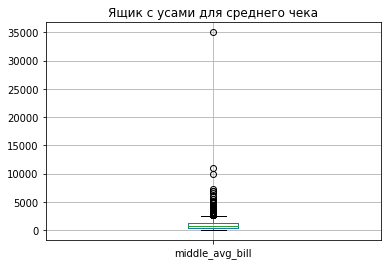

In [33]:
#построим ящик с усами и проверим выбросы в среднем чеке

df.boxplot(column=['middle_avg_bill'])
plt.title('Ящик с усами для среднего чека')
plt.show()

In [34]:
#посмотрим на заведения со средним чеком выше 10 000 рублей

df.query('middle_avg_bill >= 10000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
730,чойхона,"бар,паб","Москва, Дмитровское шоссе, 95А",Северный административный округ,"ежедневно, 10:00–23:00",55.871497,37.543555,4.4,высокие,Средний счёт:5000–17000 ₽,11000.0,NaN,0,49.0,Дмитровское шоссе,False
5481,гости,ресторан,"Москва, шоссе Энтузиастов, 52",Восточный административный округ,"пн,вс 18:00–22:30",55.759088,37.760570,4.1,высокие,Средний счёт:5000–15000 ₽,10000.0,NaN,0,NaN,шоссе Энтузиастов,False
7177,кафе,ресторан,"Москва, Каширское шоссе, 23, стр. 2",Южный административный округ,"ежедневно, круглосуточно",55.657450,37.646665,4.1,высокие,Средний счёт:20000–50000 ₽,35000.0,NaN,0,100.0,Каширское шоссе,True


Три заведения в которых средний чек от 10 000 рублей, также удалим их с нашего фрейма, чтобы они сильно не искажали данные.

In [35]:
#удаляем заведения со средним чеком более 10 000 рублей

df = df.query('middle_avg_bill != [10000, 11000, 35000]')

#### Столбец 'middle_coffee_cup'

Здесь также не получится заменить пропуски заглушкой, т.к. данные берутся со столбца `avg_bill`. Если строка содержит в себе текст `Цена чашки капучино:`, тогда данные попадают в солбец `middle_avg_bill`. Необходимо проверить ввошли ли все данные.

In [36]:
#найдем количество строк, которые содержат в себе текст "Цена чашки капучино"

len(df.loc[df['avg_bill'].apply(lambda x: x.find('Цена чашки капучино')) != -1])

535

535 строк содержат в себе данные со средней ценой чашки капучино, по этому такое же количество данных должно быть в столбце `middle_coffee_cup`

In [37]:
print(f"Заполненные данные в столбце middle_coffee_cup: {df['middle_coffee_cup'].count()}")

Заполненные данные в столбце middle_coffee_cup: 535


In [38]:
#узнаем минимальный и максимальный средний чек для чашки капучино

print(f"Минимальный средний чек за чашку капучино: {df['middle_coffee_cup'].min()}")
print(f"Максимальный средний чек за чашку капучино: {df['middle_coffee_cup'].max()}")

Минимальный средний чек за чашку капучино: 60.0
Максимальный средний чек за чашку капучино: 1568.0


In [39]:
#посмотрим на заведения в которых цена за чашку капучино больше 1000 рублей

df.query('middle_coffee_cup >= 1000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0,Большая Семёновская улица,False


Здесь явно ошибка в данных, так как скорее всего это средний чек, а не стоимость за кофе. Т.к. "Шоколадница" это сеть, мы можем заполнить данный выброс средней ценой чашки капучино по этой сети.

In [40]:
#сделаем срез данных

test = df.query('name == "шоколадница" and middle_coffee_cup != 1568')
print(f"Средняя цена за капучино по сети Шоколадница равно: {round(test['middle_coffee_cup'].mean(), 0)}")

Средняя цена за капучино по сети Шоколадница равно: 256.0


In [41]:
#заполним аномалию на средний чек за капучино по сети

df['middle_coffee_cup'] = df['middle_coffee_cup'].replace(1568, 256)

#### Столбец 'chain'

In [42]:
#проверим уникальные значения столбца chain

df['chain'].unique()

array([0, 1])

Всё верно, всего два значения 0 - несетевое заведение, 1 - сетевое заведение.

#### Столбец 'seats'

В данном столбце практически 50% пропусков, которые мы удалить не можем и не можем заполнить заглушкой, так как данные хранятся в числовом виде.

In [43]:
#проверим уникальные значения столбца seats

df['seats'].value_counts().sort_index(ascending=True)

0.0       136
1.0         4
2.0        15
3.0        13
4.0        25
         ... 
760.0       1
920.0       2
1040.0      4
1200.0      1
1288.0     11
Name: seats, Length: 229, dtype: int64

У нас есть аномальные заведения у которых посадочных мест 0 или более 1000. Посмотрим на них в срезе.

In [44]:
#делаем срез данных для заведений без посадочных мест

df[df['seats'] == 0]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
84,meat doner kebab,булочная,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896987,37.608126,4.5,нет информации,Средний счёт:300 ₽,300.0,NaN,0,0.0,улица Лескова,True
177,арамье,булочная,"Москва, улица 800-летия Москвы, 22, корп. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.879392,37.556832,4.0,нет информации,нет информации,NaN,NaN,1,0.0,улица 800-летия Москвы,False
196,донер шашлык,ресторан,"Москва, улица Лескова, 22",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.896962,37.608300,4.5,нет информации,нет информации,NaN,NaN,0,0.0,улица Лескова,True
203,тандыр № 1,кафе,"Москва, улица Лескова, 22Г",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.895615,37.611049,4.0,нет информации,нет информации,NaN,NaN,1,0.0,улица Лескова,True
211,неаполитан пицца,кафе,"Москва, улица Пришвина, 23",Северо-Восточный административный округ,"ежедневно, 12:00–23:00",55.885416,37.604650,4.3,нет информации,нет информации,NaN,NaN,0,0.0,улица Пришвина,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8118,бико,булочная,"Москва, улица Симоновский Вал, 13, стр. 3",Юго-Восточный административный округ,"ежедневно, 08:00–20:00",55.723340,37.664252,1.3,нет информации,нет информации,NaN,NaN,0,0.0,улица Симоновский Вал,False
8168,чайхана уч кудук,кофейня,"Москва, улица Симоновский Вал, 26, корп. 1",Южный административный округ,"ежедневно, 09:00–00:00",55.718663,37.662887,4.3,нет информации,нет информации,NaN,NaN,0,0.0,улица Симоновский Вал,False
8172,масса кофе,кофейня,"Москва, Холодильный переулок, 2",Южный административный округ,"пн-пт 08:00–20:00; сб,вс 09:00–20:00",55.709713,37.624388,4.3,средние,Цена чашки капучино:100–210 ₽,NaN,155.0,0,0.0,Холодильный переулок,False
8336,сочная шаурма в кузьминках,быстрое питание,"Москва, Волгоградский проспект, 102",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.703834,37.773831,3.9,нет информации,Средний счёт:120–130 ₽,125.0,NaN,0,0.0,Волгоградский проспект,True


Данные места являются заведениями быстро питания и скорее всего у них нет посадочных мест, по этому мы оставим их во фрейме.

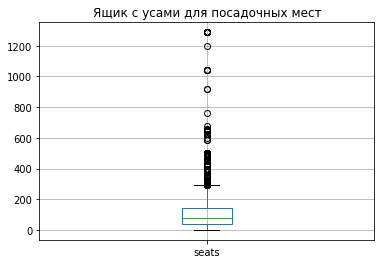

In [45]:
#строим ящик с усами, чтобы проверить выбросы

df.boxplot(column=['seats'])
plt.title('Ящик с усами для посадочных мест')
plt.show()

Заведения на более 400 посадочных мест являются выбросами, скорее всего это большие банкетные залы, рестораны, заводские столовые. Мы их также оставим в датасете, чтобы не потерять информацию по другим параметрам.

### Шаг №3: Исследовательский анализ данных

#### Заведения по категориям

In [48]:
#посмотрим какие категории заведений представленны в данных и какое их количество

category = (df
            .groupby('category')['name']
            .count()
            .reset_index()
            .sort_values(by='name', ascending=False))
category.columns = ['category', 'count']

In [49]:
#строим столбчатую диаграмму

fig = px.bar(category, 
             x='category', 
             y='count', 
             text='count'
            )

fig.update_layout(title='Количество заведений по категориям', 
                  title_x=0.5,
                  xaxis_title='Категории',
                  yaxis_title='Количество')
fig.show()

_Наибольшее количество заведений в городе Москва, относится к категориям **кафе и ресторан (2348, 2002)**, меньше всего в городе **столовых и булочных (312, 254).**_

#### Посадочные места по категориям

In [50]:
#чтобы подготовить таблицу для визуализации, нам необходимо убрать заведения в которых есть заглушка -1

seats = df.query('seats != -1')

#сгруппируем данные по категориям и посчитаем среднее значение количества посадочных мест

seats_grouped = (df
                .groupby('category')
                .agg(median_seats = ('seats', 'median'))
                .reset_index()
                .sort_values(by='median_seats', ascending=False))

#преобразуем количество посадочных мест в целое число

seats_grouped['median_seats'] = seats_grouped['median_seats'].astype('int')

In [51]:
#строим столбчатую диаграмму

fig = px.bar(seats_grouped, 
             x='category', 
             y='median_seats', 
             text='median_seats'
             )

fig.update_layout(title='Среднее количество мест заведений по категориям',
                  title_x=0.5,
                  xaxis_title='Категории',
                  yaxis_title='Среднее количество посадочных мест')


fig.show()

_Из диаграммы видим, что наибольшее количество посадочных мест предлагают такие заведения как **рестораны и бары (более 80)**,  наименьшее количество посадочных мест имеет категория **булочная (менее 55)**._

#### Соотношение сетевых и несетевых заведений

In [52]:
#сгруппируем данные по столбцу chain и посчитаем их количество

chain = (df
        .groupby('chain')['name']
        .count()
        .reset_index())

#добавим понятные названия

chain['chain'] = chain['chain'].replace([0,1],['несетевые', 'сетевые'])

#переименуем колонки

chain.columns = ['type', 'count']

In [53]:
#строим круговую диаграмму

fig = go.Figure(data=[go.Pie(labels=chain['type'],
                           values=chain['count'],
                           pull = [0.1, 0])])
      

fig.update_layout(title='Распределение заведений по сетям',
                  title_x=0.5,
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12,
                                    y=1.05,
                                    text='Тип сети',
                                    showarrow=False)])
fig.show()

_Из диаграммы видим, что в Москве больше всего находится **несетевых заведений 61.9% (в количестве 5128).**_

#### Категории заведений по сетям

In [54]:
#сделаем срез данных для заведений которые являются сетевыми
cat_by_chain = df.query('chain == 1')

#сгруппируем данные по столбцу категория для сетевых заведений
cat_by_chain_grouped = (cat_by_chain
                        .groupby('category')['name']
                        .count()
                        .reset_index()
                        .sort_values(by='name', ascending=False))


#сгруппируем данные по столбцу категория для всех заведений
cat_by_chain_all = (df
                    .groupby('category')['name']
                    .count()
                    .reset_index()
                    .sort_values(by='name', ascending=False))

#объеденим таблицы

chain_per = pd.merge(cat_by_chain_grouped, cat_by_chain_all, how='left', on='category')

#переименуем столбцы
chain_per.columns = ['category', 'chain_cnt', 'total']

#рассчитаем долю сетевых заведений
chain_per['percent'] = round(chain_per['chain_cnt'] / chain_per['total'] * 100, 2)

chain_per

,category,chain_cnt,total,percent
0,кафе,779,2378,32.76
1,ресторан,730,2041,35.77
2,кофейня,719,1412,50.92
3,пиццерия,330,633,52.13
4,быстрое питание,232,603,38.47
5,"бар,паб",169,764,22.12
6,булочная,157,256,61.33
7,столовая,88,315,27.94


In [55]:
#строим столбачутую диаграмму
fig = px.bar(chain_per.sort_values(by='percent', ascending=False), 
             x='category', 
             y='percent', 
             text='percent'
             )

fig.update_layout(title='Доля сетевых заведений по категориям',
                  title_x=0.5,
                  xaxis_title='Категории',
                  yaxis_title='Доля')
fig.show()

_Наибольшая доля сетевых заведений относится к категории **булочная 61.02%**, за ней следует **пиццерия и кофейня (52.15%, 50.83%)** наименьше всего сетей находится в категории **бар, паб (22.39%).**_

#### Топ-15 популярных сетей 

In [56]:
#для начала получим срез данных для заведений которые являются сетью
chain_place = df.query('chain == 1')

#сгруппируем данные по наименованиям и выделим топ-15 сетей
top_15 = (chain_place
          .groupby('name')['address']
          .count()
          .reset_index()
          .sort_values(by='address', ascending=False)
         .head(15)
         .rename(columns={'address':'count'}))

top_15

,name,count
727,шоколадница,120
335,домино с пицца,76
331,додо пицца,74
740,яндекс лавка,72
147,one price coffee,71
58,cofix,65
168,prime,50
663,хинкальная,44
408,кофепорт,42
417,кулинарная лавка братьев караваевых,39


In [57]:
#так как сеть может иметь разные категории заведений, отфильтрует таблицу по наименованию топ-15 сетей
#создаем список

top_15_list = top_15['name'].tolist()

#теперь делаем срез датафрейма
top_15_cat = df.query('name in @top_15_list')

#сгруппируем данные по наименованиям и категориям
top_15_cat_2 = (top_15_cat
                .groupby(['name','category'])['address']
                .count()
                .reset_index()
                .sort_values(by='address', ascending=False)
                .rename(columns={'address':'count'})
               )

In [58]:
# строим столбчатую диаграмму 
fig = px.bar(top_15_cat_2,
             x='count',
             y='name',
             text='count',
             template='plotly_white',                    
             color='category')

fig.update_layout(title='Топ-15 сетевых заведений по категориям',
                  title_x=0.5,
                   xaxis_title='Количество заведений',
                   yaxis_title='Наименование сети',
                   legend_title_text='Категории',
                   yaxis={'categoryorder':'total ascending'})
fig.show()

_Больше всего город охватила сеть **Шоколадница (117 заведений: 116 кофейня и 1 кафе)**, за ней следуют пиццерии **доминос пицца и додо пицца (77 и 73 заведений)**, меньше всего объектов имеет сеть под названием **Му му (26 заведений)**_

#### Количество заведений по районам и категориям

In [59]:
#выведем общее количество заведений в городе Москва

print(f"Общее количество заведений в городе Москва равно: {df['name'].count()}")

Общее количество заведений в городе Москва равно: 8402


In [60]:
#построим таблицу, которая покажет какое количество заведений расспределилось по районам и категориям

by_district = (df
              .groupby(['district', 'category'])['name']
               .count()
               .reset_index()
               .sort_values(by='name', ascending=False))

by_district = by_district.rename(columns={'name':'count'})

In [61]:
#построим столбачую диаграмму, которая показывает как расспределились заведения по категориям и районам

fig = px.bar(by_district,
             x='count',
             y='district',
             template='plotly_white',                    
             color='category')

fig.update_layout(title='Распределение количества заведений по районам и категориям',
                  title_x=0.5,
                   xaxis_title='Количество заведений',
                   yaxis_title='Наименование района',
                   legend_title_text='Категории',
                   yaxis={'categoryorder':'total ascending'})
fig.show()

_Диаграмма показывает нам, что наибольшее количество заведений (более 2000) находится в районе **Центральный административный округ**, что является логичным для центра столицы, где расспологается огромное количество офисов, а также туристов; наименьшее количество заведений (менее 500) находится в районе **Северо-Западный административный округ**. Для всех районов характерно одинаковое расспределение заведений по категориям: на первом месте это **ресторан**, далее **кафе, кофейня**, и меньше всего на районах находятся **столовая и булочная**_

#### Средний рейтинг по категориям

In [62]:
#оформляем таблицу для расчета среднего рейтинга по категориям

by_rating = (df
             .groupby('category')
             .agg({'rating' : 'mean'})
             .reset_index()
            .sort_values(by='rating', ascending=False))

#округлим значения рейтинг до трёх знаков после запятой

by_rating['rating'] = by_rating['rating'].round(3)

In [63]:
# строим столбчатую диаграмму 

fig = px.bar(by_rating, 
             x='category', 
             y='rating', 
             text='rating'
             )

fig.update_layout(title='Средний рейтинг по категориям',
                  title_x=0.5,
                  xaxis_title='Категории',
                  yaxis_title='Средний рейтинг')

fig.update_yaxes(range=[4, 4.5])
fig.show()

_Средний рейтинг практически одинаковый для всех категорий: между 4.0 и 4.5, но тем не менее наивысший средний рейтинг имеет категория **бар, паб (4.389)**, а наименьший рейтинг **быстрое питание (4.05)**_

#### Хороплет со средним рейтингом

Данные с границами районов города Москва мы возьмём из файла `admin_level_geomap.geojson`

In [64]:
#прочитаем файл с границами районов и сохраним его в переменную

with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [65]:
#оформляем таблицу для построения хороплета со средним рейтингом по районам

dis_rt = (df
          .groupby('district', as_index=False)['rating']
          .agg('mean')
          .round(3))

In [66]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dis_rt,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

_Из хороплета видно, что наивысший средний рейтинг заведений имеет **Центральный административный округ (4.38)**, наименьший рейтинг имеет **Юго-Восточный административный округ (4.1)**_

#### Заведения на карте

In [67]:
#отобразим все заведения на карте с помощью кластеров библиотеки folium

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df.apply(create_clusters, axis=1)

# выводим карту
m

_Из карты видно, что наибольшее количество заведений находится ближе к центру Москвы, наименьше всего заведений в южной части города_

#### Топ-15 улиц по количеству заведений

In [68]:
#оформим таблицу, которая будет показывать топ-15 улиц по количеству заведений

top15_str = (df
            .groupby('street')['name']
            .count()
            .reset_index()
            .sort_values(by='name', ascending=False))

top15_str.columns = ['street','count']
top15_str = top15_str.head(15)
top15_str

,street,count
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,87
455,Каширское шоссе,76
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [69]:
#теперь оформим таблицу, которая будет показывать количество заведений по улицам и категориям

category_str = (df
               .groupby(['street', 'category'])['name']
               .count()
               .reset_index())

category_str.columns = ['street', 'category','count']
category_str

,street,category,count
0,1-й Автозаводский проезд,кафе,1
1,1-й Балтийский переулок,ресторан,1
2,1-й Варшавский проезд,кафе,1
3,1-й Вешняковский проезд,кафе,1
4,1-й Волоколамский проезд,кафе,1
...,...,...,...
3817,шоссе Энтузиастов,кафе,10
3818,шоссе Энтузиастов,кофейня,7
3819,шоссе Энтузиастов,пиццерия,2
3820,шоссе Энтузиастов,ресторан,6


In [70]:
#объеденим таблицы в одну, где будет топ-15 улиц с заведениями по категориям

total_str = pd.merge (top15_str, category_str, how ='left', on='street')

#переименуем столбцы
total_str.columns = ['street', 'total_places_cnt', 'category', 'count']

#отсортируем таблицу
total_str = total_str.sort_values(by='count', ascending=False)

In [71]:
#построим столбачую диаграмму, которая показывает как расспределились заведения по категориям  в топ-15 улицах

fig = px.bar(total_str,
             x='count',
             y='street',
             template='plotly_white',                    
             color='category')

fig.update_layout(title='Распределение количества заведений по категориям в топ-15 улицах',
                  title_x=0.5,
                   xaxis_title='Количество заведений',
                   yaxis_title='Наименование улицы',
                   legend_title_text='Категории',
                   yaxis={'categoryorder':'total ascending'})
fig.show()

_Из диаграммы видно, что наибольшее количество заведений, из рейтинга Топ-15 улиц, находится на **проспекте Мира (более 150)**, а наименьшее количество на **Алтуфьевскогм шоссе (менее 50)**. В основном на улицах находятся заведения из категории **кафе, ресторан, кофейня**, меньше всего **столовая, булочная**_

#### Улицы с одним объектом общепита

In [72]:
#сгруппируем данные по улицам, где всего одно заведение

one_place_str = (df
                .groupby('street')['name']
                .count()
                .reset_index()
                .rename(columns={'name' : 'count'}))

one_place_str = one_place_str.query('count == 1')

print(f"Всего улиц с одним заведением равно: {len(one_place_str)}")

Всего улиц с одним заведением равно: 458


In [73]:
#добавим категории заведений к улицам с одним объектом общепита
total_str_2 = pd.merge (one_place_str, category_str, how ='left', on='street')

#переименуем столбцы
total_str_2.columns = ['street', 'total_places_cnt', 'category', 'count']

In [74]:
# построим гистограмму, чтобы увидеть распределение заведений по категориям
fig = px.histogram(total_str_2,
                   x='category',
                   nbins=1000)

fig.update_layout(title='Распределение категорий заведений',
                  title_x=0.5,
                   xaxis_title='Категория',
                   yaxis_title='Частота',
                   xaxis={'categoryorder':'total descending'})
fig.show()

_Из гистораммы мы видим, что чаще всего заведения, которые являются единственным объектом общепита на улице, относятся к категории **кафе**, меньше всего **булочная**_

#### Хороплет для среднего чека по районам города

In [75]:
#оформляем таблицу для построения хороплета для медианного среднего чека по районам

dis_avg_bill = (df
          .groupby('district', as_index=False)['middle_avg_bill']
          .agg('median')
          .round(2))

In [76]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=dis_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m)

# выводим карту
m

_Самый высокий средний чек (1000 рублей) приходится на **Центральный и Западный административные округа**, также на карту попали несколько загородных посёлков и аэропорт "Внуково". Самый низкий средний чек имеет **Южный и Юго-Восточный административные округа**. В данном случае тяжело сделать вывод "чем дальше от центра, тем дешевле", об этом нам говорит "Западный административный округ", скорее всего ценны меняются от "престижности" района: более элитные районы имееют дорогие заведения и наоборот_

#### Распределение заведений по режиму работы

In [77]:
#посмотрим каких заведений больше круглосуточных или нет

time = (df
       .groupby('is_24_7')['name']
       .count()
       .reset_index()
       .rename(columns={'name':'count'}))

#дадим понятные названия
time['is_24_7'] = time['is_24_7'].replace([False, True],['некруглосуточно', 'круглосуточно'])

In [78]:
#строим круговую диаграмму

fig = go.Figure(data=[go.Pie(labels=time['is_24_7'],
                           values=chain['count'],
                           pull = [0.1, 0])])
      

fig.update_layout(title='Распределение заведений по режиму работы',
                  title_x=0.5,
                  width=800, 
                  height=600,
                  annotations=[dict(x=1.12,
                                    y=1.05,
                                    text='Режим работы',
                                    showarrow=False)])
fig.show()


_Из диаграммы мы видим, что заведений, которые работают некруглосуточно больше (61.9%), круглосуточные заведения составляют 38.1 %_

In [79]:
#посмотрим распределение заведений по режиму работы в разрезе по категориям
time_2 = (df
          .groupby(['category', 'is_24_7'])['name']
          .count()
          .reset_index()
          .rename(columns={'name':'count'})
         .sort_values(by='count', ascending=False))

#дадим понятные названия
time_2['is_24_7'] = time_2['is_24_7'].replace([False, True],['некруглосуточно', 'круглосуточно'])

#оформим два датафрейма для круглосуточных и некруглосуточных заведений, чтобы построить два графика

places_24 = time_2.query('is_24_7 == "круглосуточно"')
places_not_24 = time_2.query('is_24_7 == "некруглосуточно"')

In [80]:
#строим столбчатую диаграмму 
fig = px.bar(places_24,
             x='count',
             y='is_24_7',
             text='count',
             template='plotly_white',                    
             color='category')

fig.update_layout(title='Распределение круглосуточных заведений по категориям',
                  title_x=0.5,
                   xaxis_title='Количество заведений',
                   yaxis_title='Режим работы',
                   yaxis={'categoryorder':'total ascending'})
fig.show()

fig = px.bar(places_not_24,
             x='count',
             y='is_24_7',
             text='count',
             template='plotly_white',                    
             color='category')

fig.update_layout(title='Распределение некруглосуточных заведений по категориям',
                  title_x=0.5,
                   xaxis_title='Количество заведений',
                   yaxis_title='Режим работы',
                   yaxis={'categoryorder':'total ascending'})
fig.show()

_Как некруглосуточных так и круглосуточных заведений больше всего относятся к категории **кафе, ресторан**, на последнем месте **булочная**_

In [81]:
#отобразим все заведения на карте, которые работают круглосуточно
#для этого сделаем срез данных

df_24_7 = df.query('is_24_7 == True')

In [82]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
df_24_7.apply(create_clusters, axis=1)

# выводим карту
m

_Как и следовало ожидать, больше всего круглосуточных заведений находится в центре города, меньше всего в южной части_

#### Заведения с низким рейтингом

Изучим заведения с низким рейтингом: к каким категориям они относятся и место их нахождения.

In [83]:
#сделаем срез данных для заведений рейтинг которых меньше или равно 3

bad_places = df.query('rating <= 3')

In [84]:
#посчитаем долю заведений по категориям на которые приходится низкий рейтинг
#для начала посчитаем общее количество заведений

bp1 = (df
     .groupby('category')['rating']
     .count()
     .reset_index()
     .rename(columns={'rating':'count'})
     )

In [85]:
#теперь посчитаем количество заведений по категориям с низким рейтингом

bp2 = (bad_places
     .groupby('category')['rating']
     .count()
     .reset_index()
     .rename(columns={'rating':'count'})
     )

In [86]:
#объеденим две таблицы

total_bp = pd.merge (bp2, bp1, how ='left', on='category')
total_bp.columns = ['category', 'bad_rating', 'total_places']

#считаем долю "плохих" заведений
total_bp['percent'] = round(total_bp['bad_rating'] / total_bp['total_places'] * 100, 2)

#отсортируем данные 

total_bp = total_bp.sort_values(by='percent', ascending=False)

In [87]:
# строим столбчатую диаграмму 

fig = px.bar(total_bp, 
             x='category', 
             y='percent', 
             text='percent',
             title='Доля заведений с низким рейтингом'
            )

fig.update_layout(xaxis_title='Категории',
                  yaxis_title='Рейтинг')

fig.show()

_Мы видим, что наибольшая доля оценок меньше и равно 3 приходится на заведения с категорией **быстрое питание (5.84 %)**, за ним следуюет **кафе (5.03 %)**. Меньше всего плохих оценок приходится на категорию **булочная (0.79%)**_

In [88]:
# теперь посмотрим распределение заведений на карте с низким рейтингом

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
bad_places.apply(create_clusters, axis=1)

# выводим карту
m

_Больше всего заведений с низким рейтингом находится в северной части столицы, наименьшее количество на северо-западе._ 

#### Вывод исследовательского анализа

Проведя исследовательский анализ, мы можем выделить следующие тезисы:
 - В анализе участвовало **8281** объектов общественного питания в городе Москва, большую часть которых представляют **кафе (2348)** и **рестораны (2002)**, меньше всего в городе находится **булочных (254)**;
 - Наибольшее количество посадочных мест предлагают такие заведения как **рестораны и бары (более 80)**,  наименьшее количество посадочных мест имеет категория **булочные (менее 55)**;
 - Несетевых заведений в городе больше чем сетевых, доля которых составляет **61.9%**, к ним относятся категории булочные, пиццерии и кофейни, наименьше всего сетевых заведений представляют собой бары и пабы;
 - Самая попурная сеть кофейня **Шоколадница**, насчитывает в себе 117 заведений, за ней следуют "Доминос Пицца", "Додо Пицца" и "Яндекс Лавка" (более 70 заведений в сети);
 - Наибольшее количество заведений (более 2000) находится в районе **Центральный административный округ**, наименьшее количество заведений (менее 500) находится в районе **Северо-Западный административный округ**. На **проспекте Мира** находится более 150 заведений, в основном это кафе, рестораны  кофейни;
 - Наивысший средний рейтинг заведений **4.38** приходится на **Центральный административный округ**,  наименьший рейтинг **4.1** имеет **Юго-Восточный административный округ**;
 - Самый высокий средний чек (1000 рублей) приходится на **Центральный и Западный административные округа**. Самый низкий средний чек (450 рублей) имеют **Южный и Юго-Восточный административные округа**;
 - Заведений, которые работают некруглосуточно больше, их доля составляет **61.9%**. Круглосуточные заведения в основном находятся ближе к центру города;
 - Больше всего заведений с рейтингом ниже 3, имеет категория **быстрое питание (5.84 %)**.


### Шаг №4: Детализация исследования

На данном этапе мы проведём дополнительное исследование, чтобы дать рекомендации нашим Заказичкам  (фонд «Shut Up and Take My Money»), которые хотят открыть кофейню в стиле «Central Perk». Для этого мы поставим следующие задачи:

 1. Определить количество кофеен в датасете. В каких районах их больше всего и каковы особенности их расположения.
 2. Определить есть ли круглосуточные кофейни.
 3. Узнать какие у кофеен рейтинги и как они распределяются по районам.
 4. На какую стоимость чашки капучино стоит ориентироваться при открытии и почему. 

#### Задача №1

In [89]:
# определим количество кофеен

coffee_df = df.query('category == "кофейня"')

print(f"Всего кофеен в датафрейме: {len(coffee_df)}")

Всего кофеен в датафрейме: 1412


In [90]:
# теперь посмотрим где размещаются кофейни на карте

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_df.apply(create_clusters, axis=1)

# выводим карту
m

_Больше всего кофеен располагаются в **Центральном административном округе**, меньше всего их в **Южном административном округе**. Если мы рассмотрим более подробнее размещение кофеен, то увидим закономерность, они располагаются со стороны проезжей части, крайне редко во дворе. Это говорит о том, что кофейни должны располагаться в проходимом месте и где их будет хорошо видно со стороны проезжей части, чтобы увеличить поток клиентов._

#### Задача №2

In [91]:
#проверим какое количество круглосуточных кофеен есть в датафрейме

coffee_df_24 = coffee_df.query('is_24_7 == True')

print(f"Всего круглосуточных кофеен в датафрейме: {len(coffee_df_24)}")

print(f"Доля круглосуточных кофеен составляет: {round((len(coffee_df_24) / len(coffee_df)) * 100)} %")

Всего круглосуточных кофеен в датафрейме: 58
Доля круглосуточных кофеен составляет: 4 %


In [92]:
#круглосуточных кофеен очень мало, всего 4 %. Посмотрим где они разместились на карте

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_df_24.apply(create_clusters, axis=1)

# выводим карту
m

_Практически все круглосуточные кофейни расположены в центре Москвы и в минимальном количестве в других округах._

#### Задача №3

In [93]:
#оформляем таблицу для построения хороплета со средним рейтингом кофеен по районам

cofee_rat = (coffee_df
          .groupby('district', as_index=False)['rating']
          .agg('mean')
          .round(3))

In [94]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=cofee_rat,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='RdPu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m)

# выводим карту
m

_Самый высокий средний рейтинг кофеен **4.34** имеют **Административный и Северо-Западный административные округа**, самый низкий средний рейтинг **4.19** приходится на **Западный административный округ**._

#### Задача №4

Чтобы определить какую цену установить за чашку кофе, нам нужно понимать где мы хотим открыть кофейню. По этому нужно ориентироваться на округ.

In [95]:
#сгруппируем таблицу по округам и посчитаем мединное значение чашки кофе

coffee_price = (coffee_df
               .groupby('district')['middle_coffee_cup']
               .median()
               .reset_index()
               .sort_values(by='middle_coffee_cup', ascending=False)
               )

#узнаем среднюю стоимость чашки кофе по всему городу
print(f"Средняя стоимость чашки кофе в городе Москва равно: {coffee_df['middle_coffee_cup'].median()}")

Средняя стоимость чашки кофе в городе Москва равно: 170.0


In [96]:
#строим столбчатую диаграмму

fig = px.bar(coffee_price, 
             x='middle_coffee_cup', 
             y='district', 
             text='middle_coffee_cup'
            )

fig.update_layout(title='Средняя стоимость чашки кофе по районам',
                  title_x=0.5,
                  xaxis_title='Средняя стоимость',
                  yaxis_title='Районы',
                  yaxis={'categoryorder':'total ascending'})

fig.show()

_Из диаграммы мы видим, что цены выше среднего имеют следующие округи: **Юго-Западный (198), Центральный(190) и Западный (187)**, наименьшая цена за чашку кофе находится в **Восточном административном округе (135)**._

#### Вывод

На основании проведенного анализа, я рекомендую Заказчику рассмотреть следующие варианты размещения кофейни:
 1. Северо-Западный административный округ: низкая конкуренция; практически нет круглосуточных кофеен; средняя цена за чашку кофе 165 рублей, практически соответствует средней цене по городу. 
 2. Западный административный округ: средняя конкуренция; практически нет круглосуточных кофеен; средняя цена за чашку кофе 187 рублей, выше средней цене по городу; низкий рейтинг по округу (4.19), чем можно воспользоваться, чтобы предложить лучший сервис и переманить покупателей к себе. 
 
Кофейня должна располагаться в удобном и проходимом месте, у проезжей части, где будет хорошо видно объект и вывеску, желательно с удобной парковкой у дороги, это увеличит поток посетителей.

### Шаг №5: Презентация

Презентацию можно посмотреть перейдя по ссылке:
<https://disk.yandex.ru/i/BgV2bXLn_bwBKw>